# Packages

In [77]:
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops, regionprops_table
import os
from glob import glob
from astropy.stats import sigma_clipped_stats
from photutils.datasets import load_star_image
from photutils.detection import DAOStarFinder
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from photutils.aperture import CircularAperture
from matplotlib.pyplot import figure
from stardist import random_label_cmap, _draw_polygons, export_imagej_rois
import time
from csbdeep.utils import Path, normalize
#import warnings
#warnings.filterwarnings('ignore')
import skimage.measure
from tifffile import imread, imwrite
from skimage.segmentation import relabel_sequential

plt.rcParams['figure.dpi'] = 300

In [131]:
!nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Nov_30_19:08:53_PST_2020
Cuda compilation tools, release 11.2, V11.2.67
Build cuda_11.2.r11.2/compiler.29373293_0
Tue May 10 14:29:00 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.00    Driver Version: 470.82.00    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  Off  | 00000000:04:00.0 Off |                  N/A |
|  0%   32C    P2    74W / 320W |  10891MiB / 11178MiB |      0%      Default |
|                               |       

In [3]:
os.environ["CUDA_VISIBLE_DEVICES"]="1" # OS environ is a list of variable in the working environment
#When changing CUDA VISIBLE you are hiding GPUs so in a way selecting the other (only works if you have 2 GPUs)


# Load the images

In [128]:
raw= np.load('Outputs/raw/scan_002_RT17_004_ROI_converted_decon_ch00_raw.npy')

lab = np.load('Outputs/labeled/scan_002_RT17_004_ROI_converted_decon_ch00_mask.npy')

# Define the cropping functions

In [5]:
#crop plane by plane

def crop_3D(image,sizex,sizey):
    
    new_image = []
    plane = image.shape[0]
    print(plane)
    for i in range(plane):
        for row in range(int(image.shape[2]/sizey)):
            for col in range(int(image.shape[1]/sizex)):
                new_image.append(image[i,col+(col*(sizex-1)):col+(col*(sizex-1))+sizex-1,row+(row*(sizey-1)):row+(row*(sizey-1))+sizey-1])

    return new_image

#crop the whole image into stacks
def crop_3D_stack(image,sizex,sizey):
    
    new_image = []
    for row in range(int(image.shape[2]/sizey)):
        for col in range(int(image.shape[1]/sizex)):
            new_image.append(image[0:image.shape[0],col+(col*(sizex-1)):col+(col*(sizex-1))+sizex-1,row+(row*(sizey-1)):row+(row*(sizey-1))+sizey-1])

    return new_image

#crop in 2D

def crop_2D(image,sizex,sizey):
    new_image = []
    for row in range(int(image.shape[1]/sizey)):
        for col in range(int(image.shape[0]/sizex)):
            new_image.append(image[col+(col*(sizex-1)):col+(col*(sizex-1))+sizex-1,row+(row*(sizey-1)):row+(row*(sizey-1))+sizey-1])

    return new_image

# Define the comparisson function 

In [6]:
# run starfind (astropy)
def findstars(p,data,fwhm,thresh):
    
    mean, median, std = sigma_clipped_stats(data, sigma=3)  
    daofind = DAOStarFinder(fwhm=fwhm, threshold=thresh*mean)  
    sources = daofind(data)
    
    if sources is None :
        pos = [np.array([254,254])]
        
    else:
        for col in sources.colnames:  
            sources[col].info.format = '%.8g'  # for consistent table output
        positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
        pos = list(positions)
        apertures = CircularAperture(positions, r=4.)

        if p == 'yes' :

            norm = ImageNormalize(stretch=SqrtStretch())
            plt.imshow(data, cmap='Greys', origin='lower', norm=norm,
                   interpolation='nearest')
            apertures.plot(color='blue', lw=1.5, alpha=0.5)
            plt.show()
    
    return pos

#function that will try to find if at the spot detected by astropy starfind labeled something 

def exactmatch(img,pos):
    
    counter = 0 

    for pos in pos:
            
        x = round(pos[0])
        y = round(pos[1])
        
        if x == 255:
            x = 254
        elif y == 255:
            y = 254
            
        #print(x,y)
        if img[y,x] > 0 : # check if at the position found by starfind on the labeled image there is a label
            counter +=1

    return counter

# main function 

def main(plot,raw_img,lab_img,sizex,sizey,fwhm,thresh):
    
    c = crop_2D(raw_img,sizex,sizey)
    l = crop_2D(lab_img,sizex,sizey)
    
    match = []
    for img,lab in zip(c,l):
        position = findstars(plot,img,fwhm,thresh)
        #print(position)
        match.append(exactmatch(lab,position))
    
    return match

# Define a function that will compute a template label to add on the images

In [7]:
def sphere_templ(best_image,object_number,big_lab_img):
    
    m = skimage.measure.regionprops_table(best_image,properties=['slice'])
    sphere = best_image[m['slice'][object_number][0],m['slice'][object_number][1],m['slice'][object_number][2]]
    
    sphere[sphere == np.max(sphere)] = np.max(big_lab_img) + 1 #change the value of the added sphere so that it doesn't interfere with already present label
    
    return sphere

#best sphere so far 

path = '/mnt/tronador/jupyter/jupyter-labs/Lab1/Nessim/Outputs/labeled/scan_002_RT17_004_ROI_converted_decon_ch00_mask.npy'

sphere = sphere_templ(crop_3D_stack(np.load(path),256,256)[60],1,np.load(path))
print(np.shape(sphere))

(5, 7, 7)


# Correction function 

The correction function works by finding objects in the z projection and adding them to the labeled image from stardist if not already present. This process is in 3 steps:
   - Detecting objects (x,y)
   - At the (x,y) detected find the z plane whith maximum intensity on the raw_image
   - if at that coordinate (x,y,z) the value of the pixel is 0 then add a sphere
 
**Note** : The spere comes from an image where the detection worked. 
  
The correction can work in splitted image and in a big image. However if the image is splitted then the correction must be looped. Moreover, the image doesn't account for near-edge non-detected objects, meaning that it will just skip then.


In [56]:
def correction(image,lab_img,sphere):
    
    xmax = np.shape(lab_img)[1]
    ymax = np.shape(lab_img)[2]
    zmax = np.shape(lab_img)[0]
    
    #print(xmax,ymax,zmax)

    new_image = lab_img.copy() #create the new_labeled image
    
    positions = findstars('t',np.max(image,axis=0),3,9) # find the objects with astropy in the raw_image z-projected
    
    counter = 0
    counter_correction = 0 
    for pos in positions: #loop for all the object found 
        x = round(list(pos)[1])
        y = round(list(pos)[0])
        z = np.where(image[:,x,y]==max(image[:,x,y]))[0][0] #find in the raw image where the z max is 

        if lab_img[z,x,y] <= 1: #if in the labeled in mage at the z,x,y coordinate there is nothing (i.e <1) 
            if x in [1,2,3,xmax-1,xmax-2,xmax-3] or y in [1,2,3,ymax-1,ymax-2,ymax-3] or z in [0,1,zmax-1,zmax-2,zmax-3]: #to avoid when the objects are too close to the edge solution -> don't replace those objects
                counter = 1 
            else:
                new_image[z-2:z+3,x-4:x+3,y-4:y+3] = sphere #replace with a sphere
                counter_correction +=1
    #print('The number of corrections are '+ str(counter_correction))
                
    return new_image,counter_correction

## Correction of the full image

2048 2048 80
The number of corrections are 82


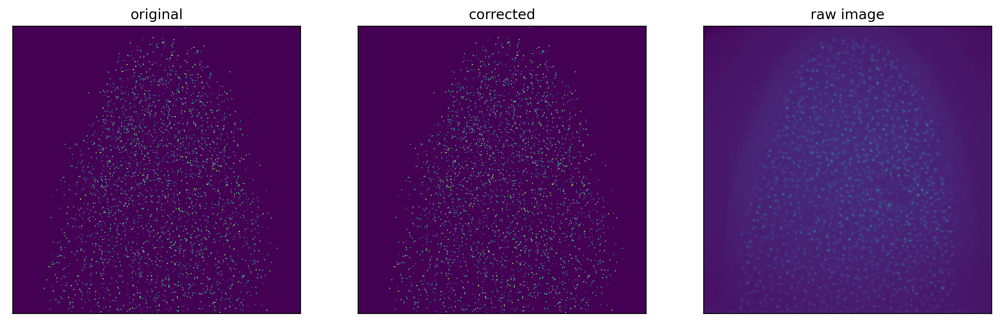

In [43]:
fig,ax = plt.subplots(1,3, sharex=True, sharey=True,figsize=(15,15))

corr_img = np.max(correction(raw,lab,sphere)[0],axis=0)

ax[0].imshow(np.max(lab,axis=0))
ax[0].set_title('original')


ax[1].imshow(corr_img)
ax[1].set_title('corrected')


norm = ImageNormalize(stretch=SqrtStretch())

ax[2].imshow(np.max(raw,axis=0),norm = norm ,interpolation='nearest')
ax[2].set_title('raw image')

for i in range(3):
    
    ax[i].set_xticks([])
    ax[i].set_yticks([])

plt.show()

## Visual representation of splitted image correction

1/64
The number of corrections are 0


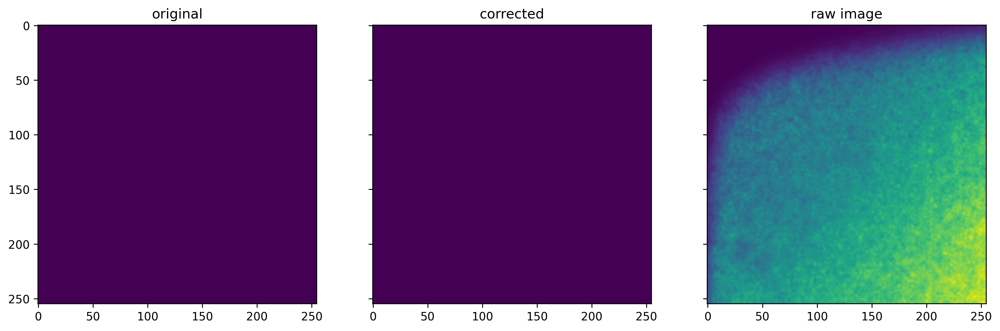

2/64
The number of corrections are 0


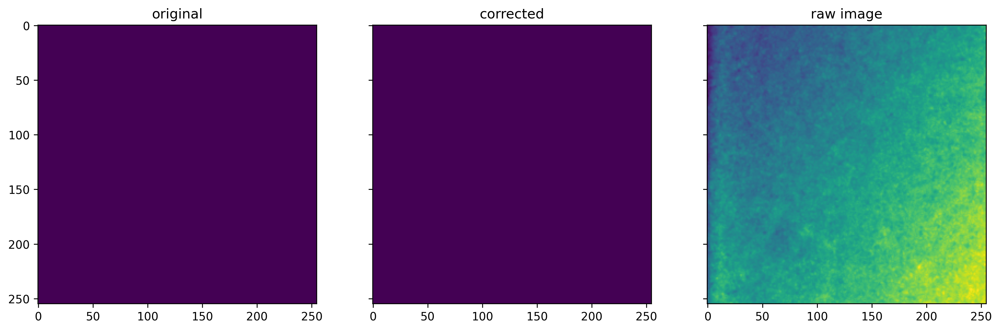

3/64
The number of corrections are 0


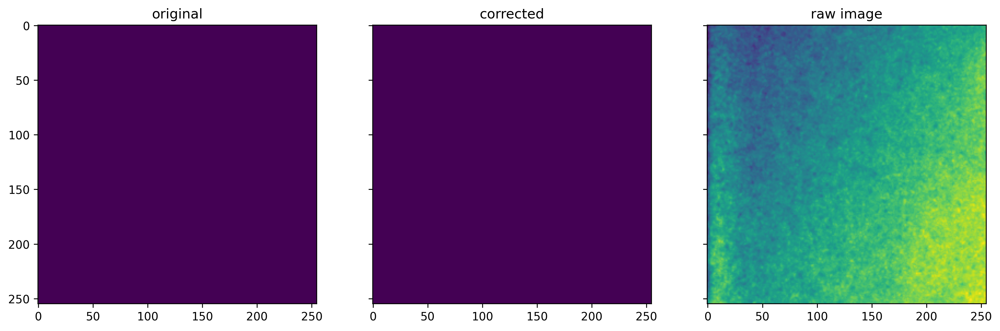

4/64
The number of corrections are 0


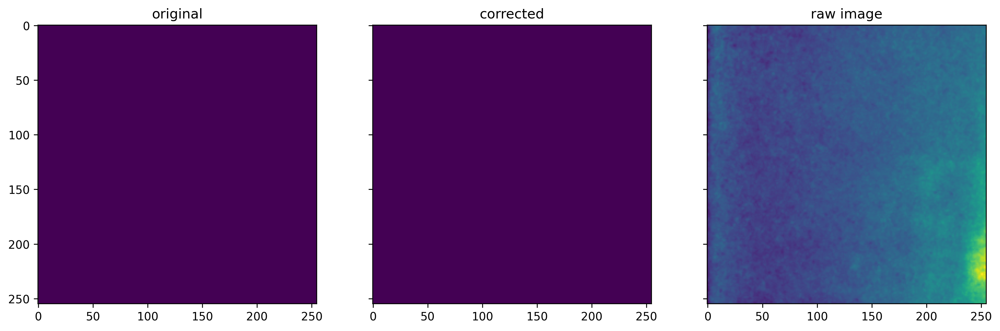

5/64
The number of corrections are 0


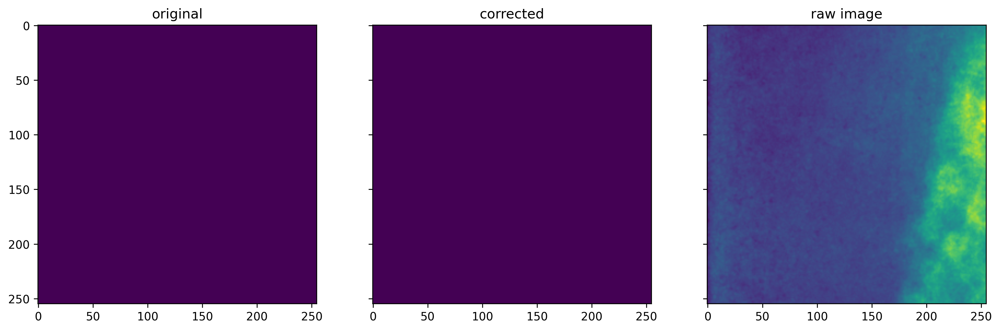

6/64
The number of corrections are 0


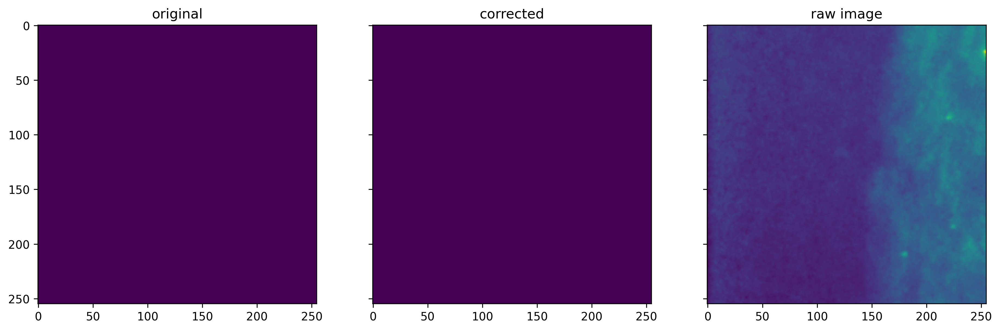

7/64
The number of corrections are 0


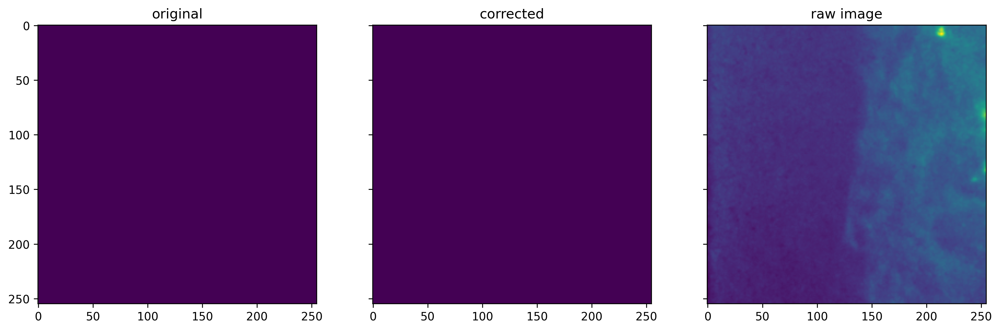

8/64
The number of corrections are 0


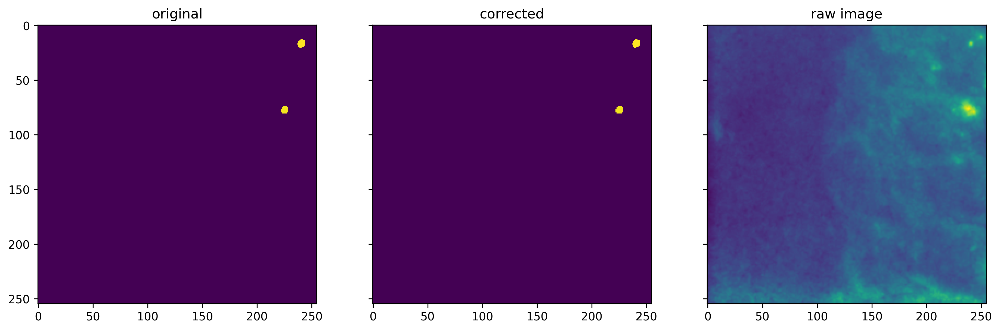

9/64
The number of corrections are 0


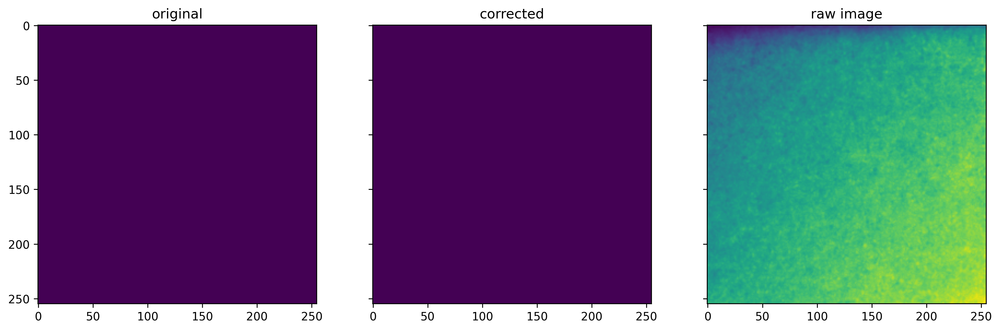

10/64
The number of corrections are 0


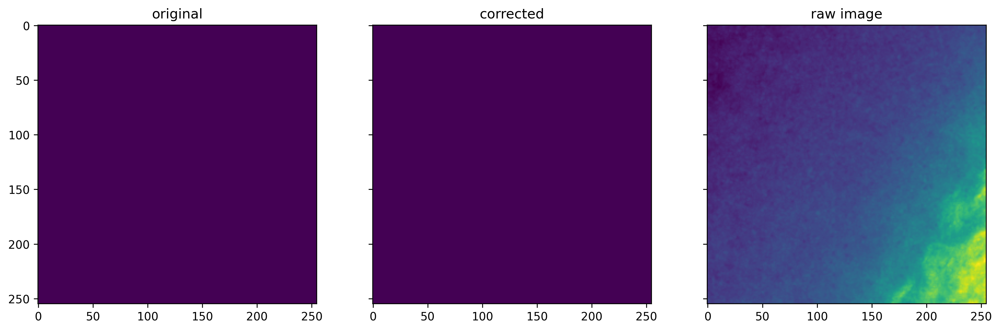

11/64
The number of corrections are 0


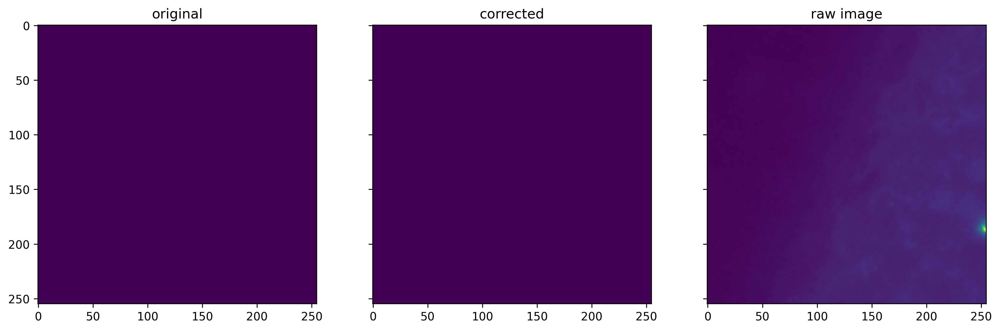

12/64
The number of corrections are 0


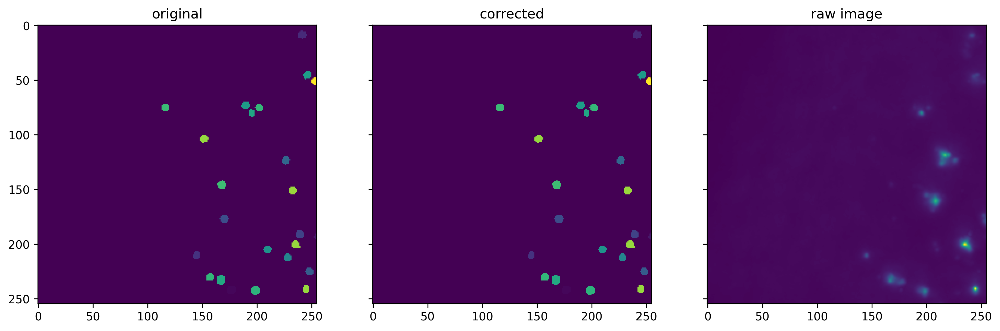

13/64
The number of corrections are 0


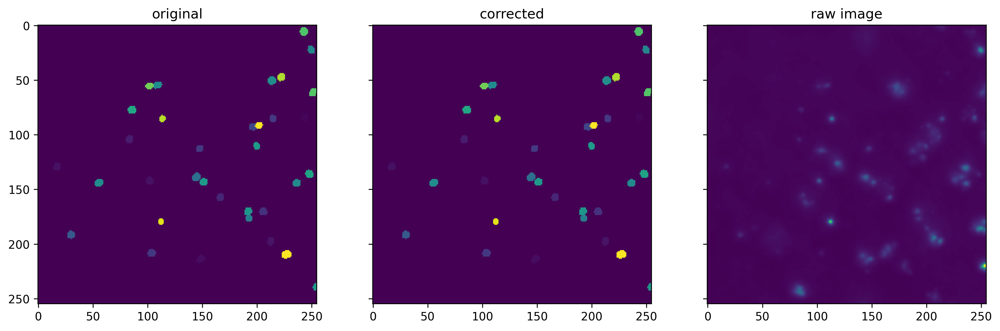

14/64
The number of corrections are 0


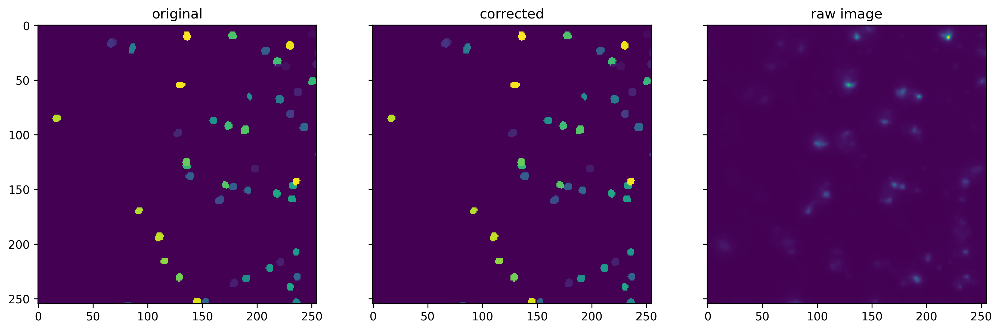

15/64
The number of corrections are 1


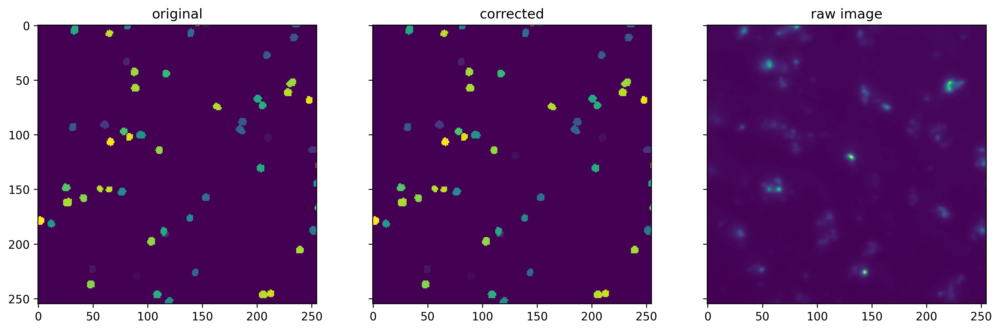

16/64
The number of corrections are 0


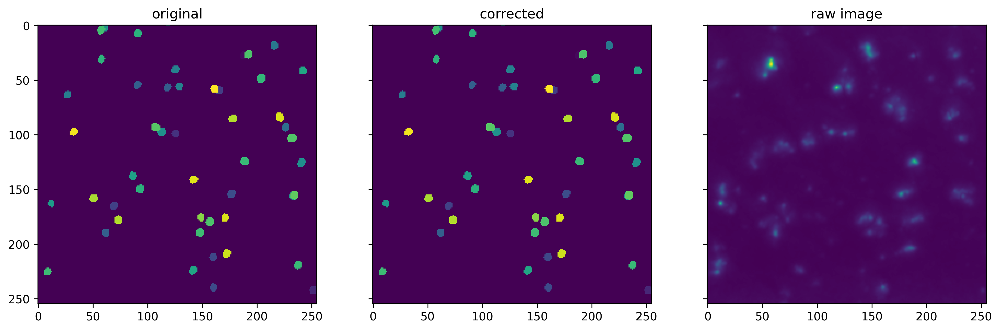

17/64
The number of corrections are 0


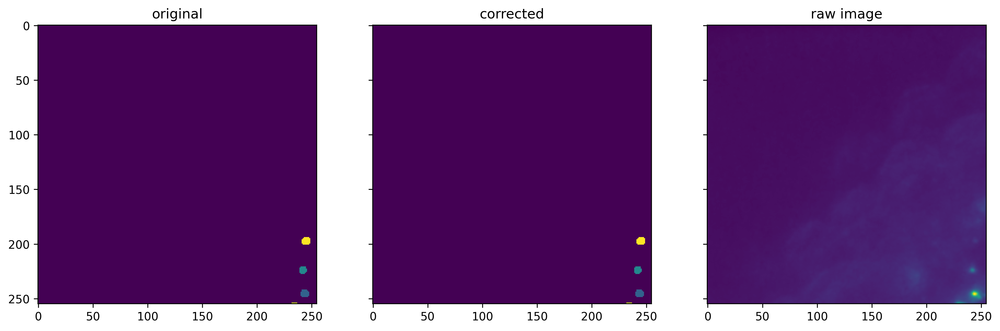

18/64
The number of corrections are 0


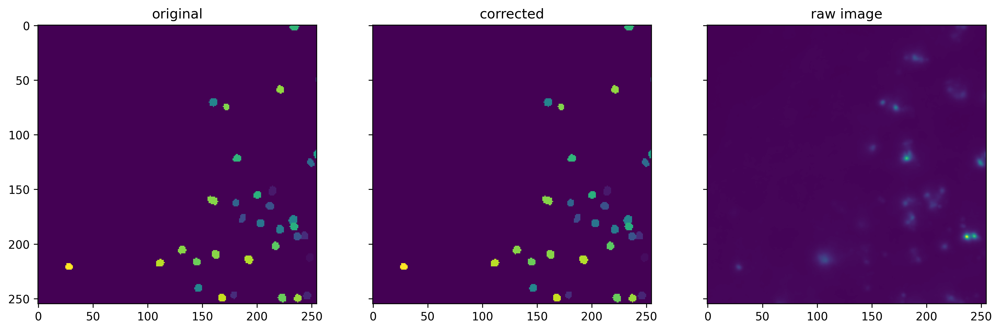

19/64
The number of corrections are 0


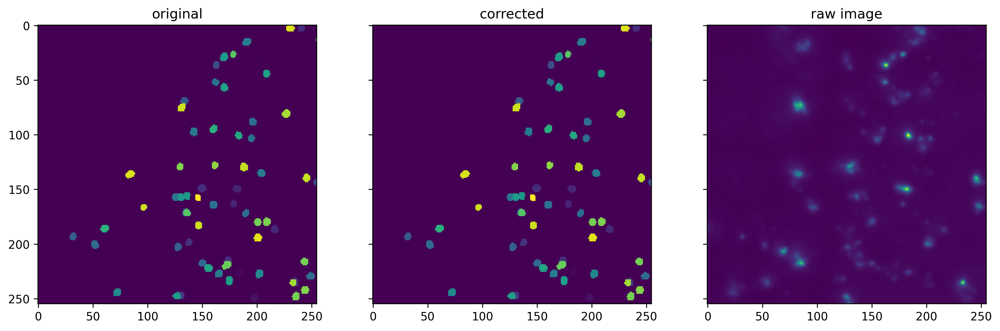

20/64
The number of corrections are 1


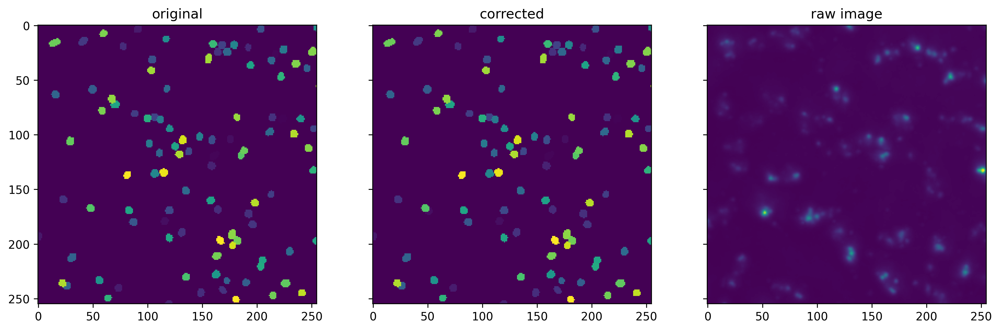

21/64
The number of corrections are 1


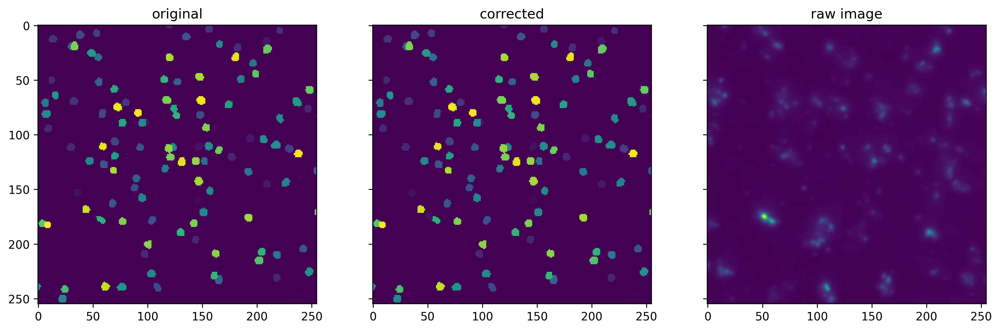

22/64
The number of corrections are 1


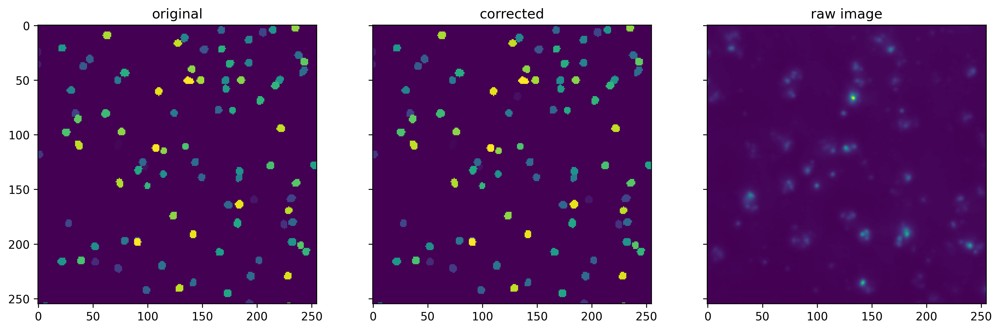

23/64
The number of corrections are 1


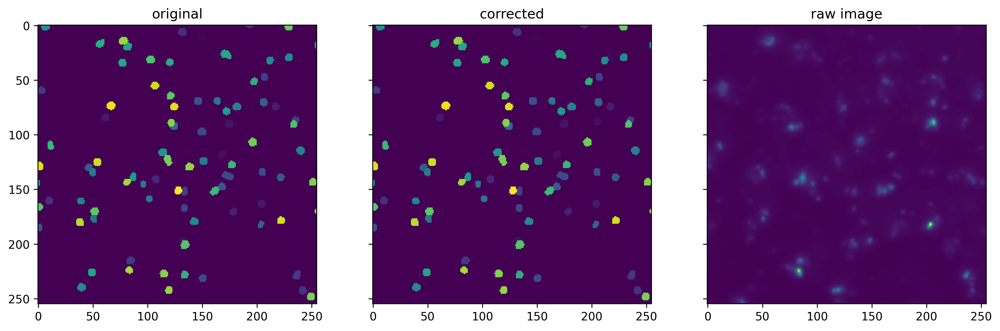

24/64
The number of corrections are 0


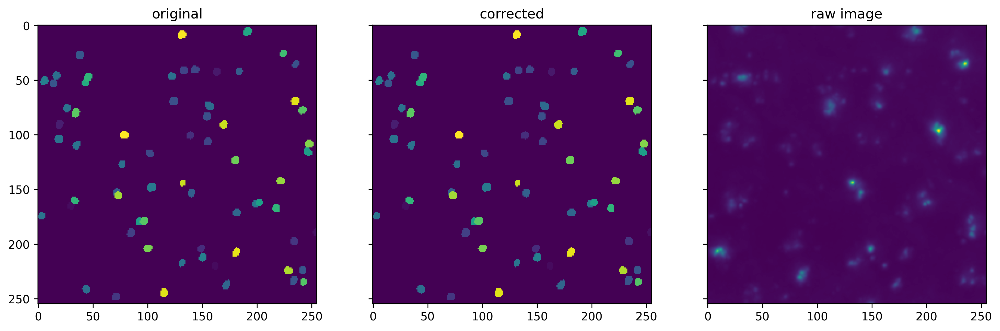

25/64
The number of corrections are 1


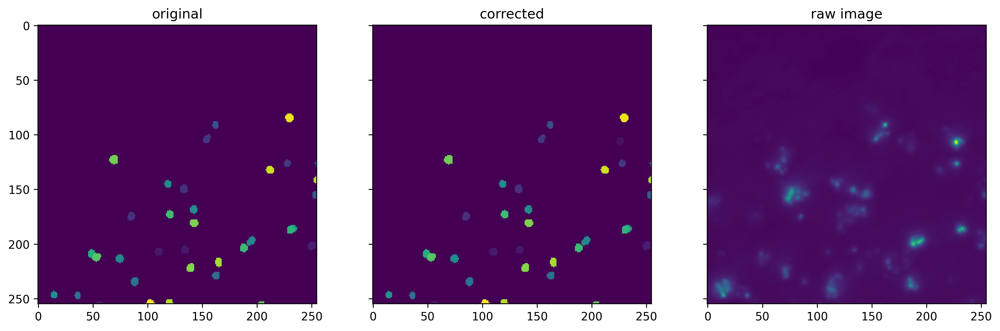

26/64
The number of corrections are 0


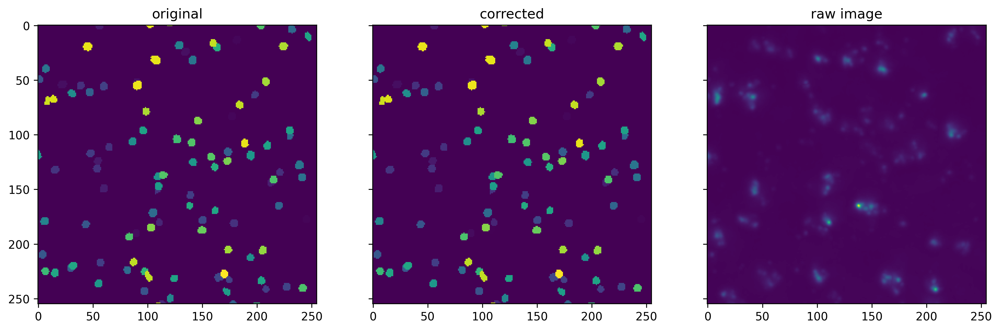

27/64
The number of corrections are 0


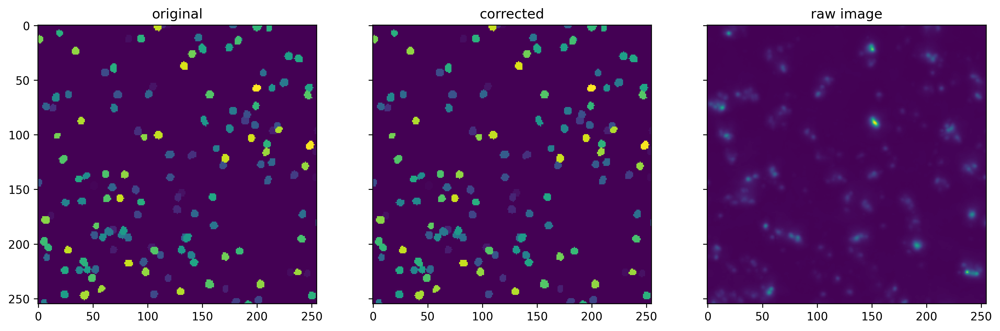

28/64
The number of corrections are 0


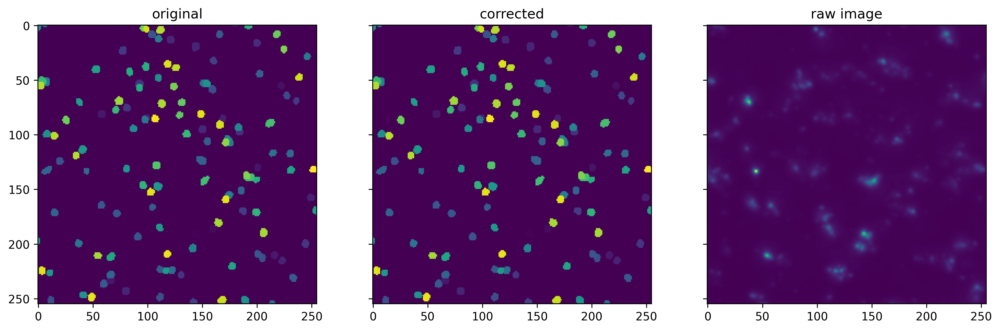

29/64
The number of corrections are 0


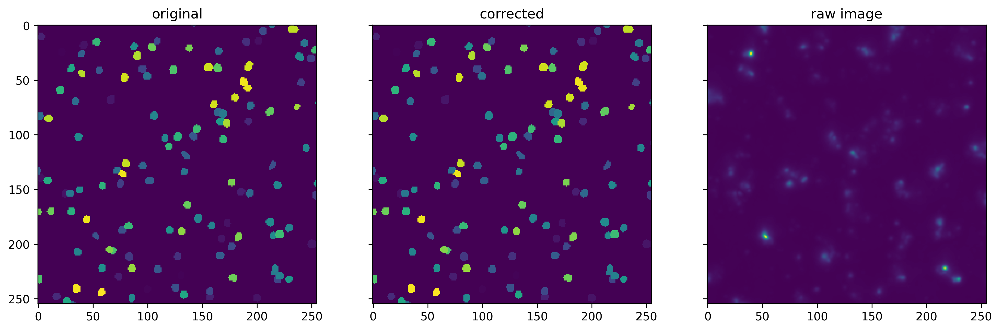

30/64
The number of corrections are 0


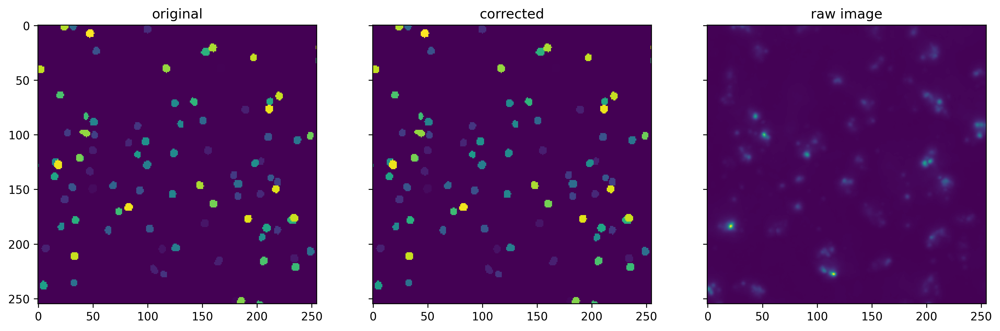

31/64
The number of corrections are 0


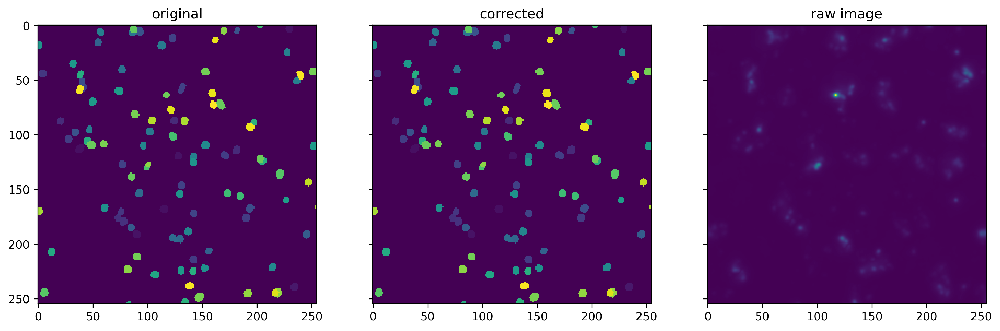

32/64
The number of corrections are 2


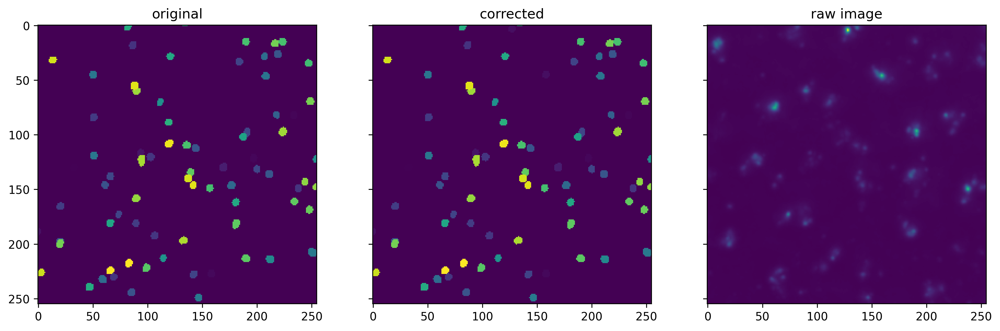

33/64
The number of corrections are 1


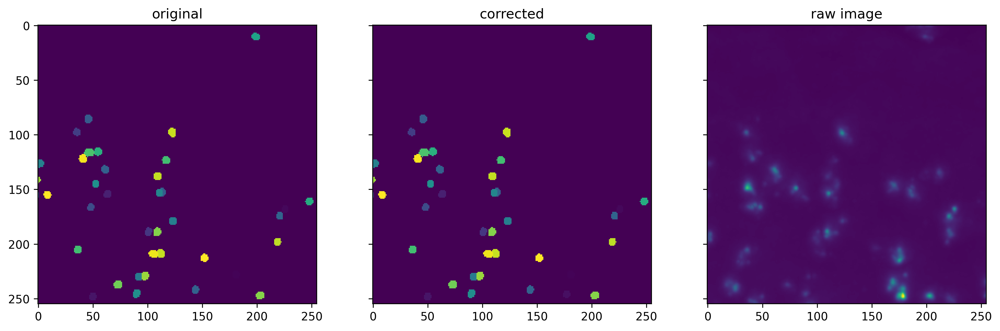

34/64
The number of corrections are 1


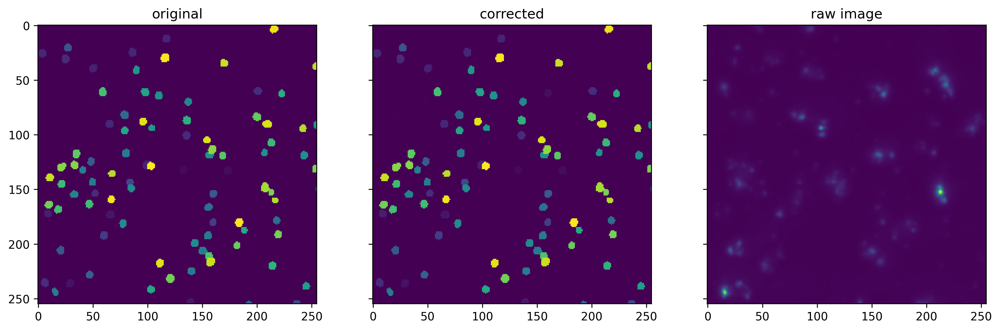

35/64
The number of corrections are 1


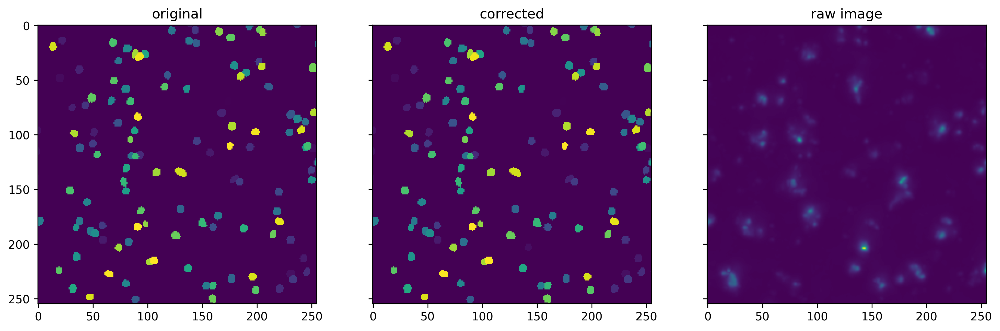

36/64
The number of corrections are 0


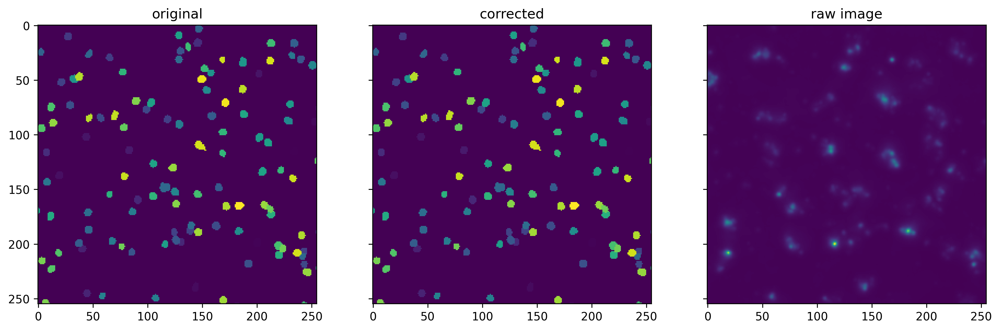

37/64
The number of corrections are 2


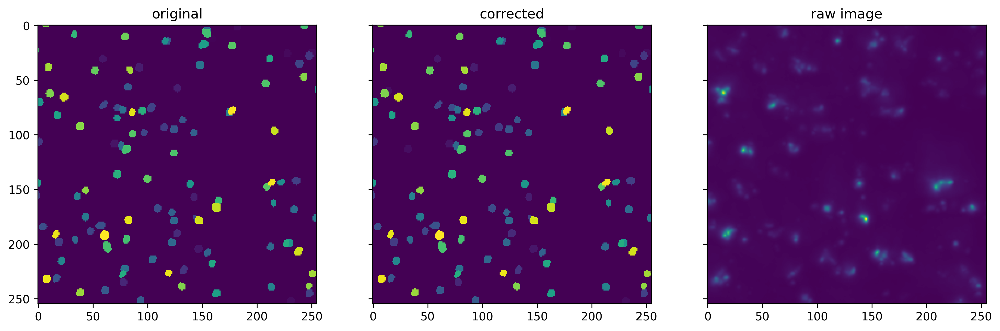

38/64
The number of corrections are 1


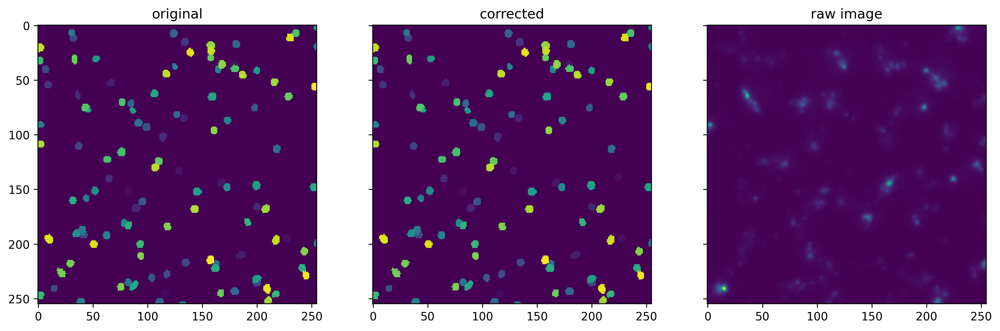

39/64
The number of corrections are 2


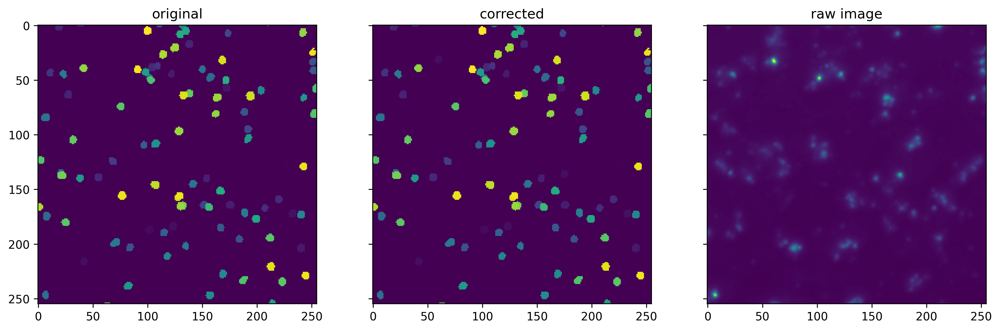

40/64
The number of corrections are 2


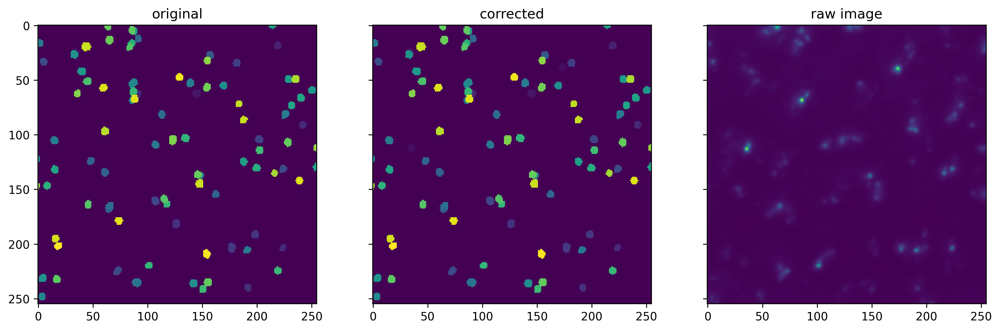

41/64
The number of corrections are 0


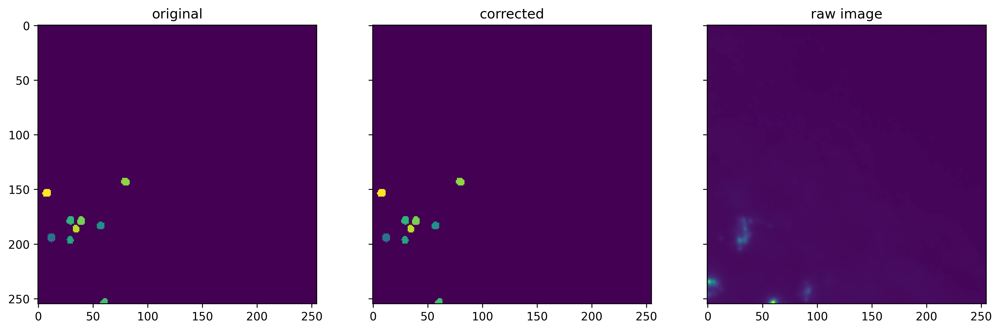

42/64
The number of corrections are 0


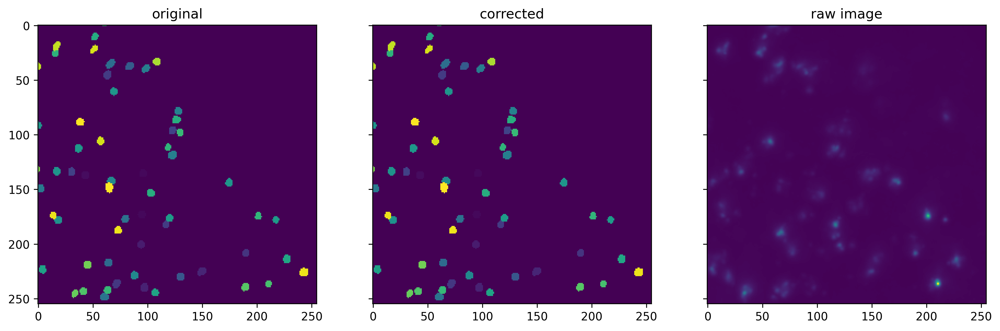

43/64
The number of corrections are 2


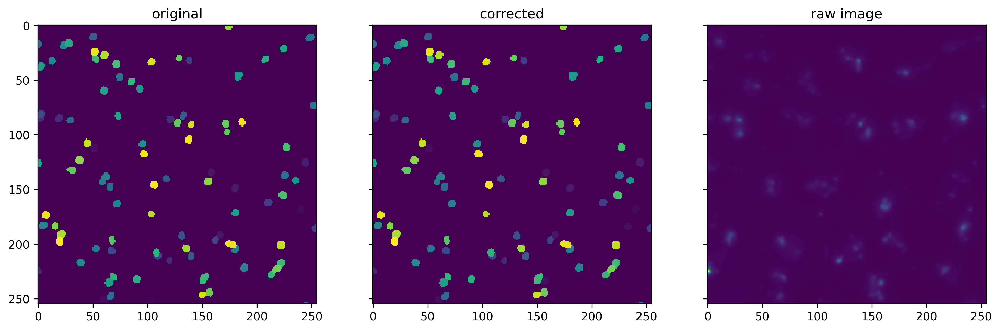

44/64
The number of corrections are 0


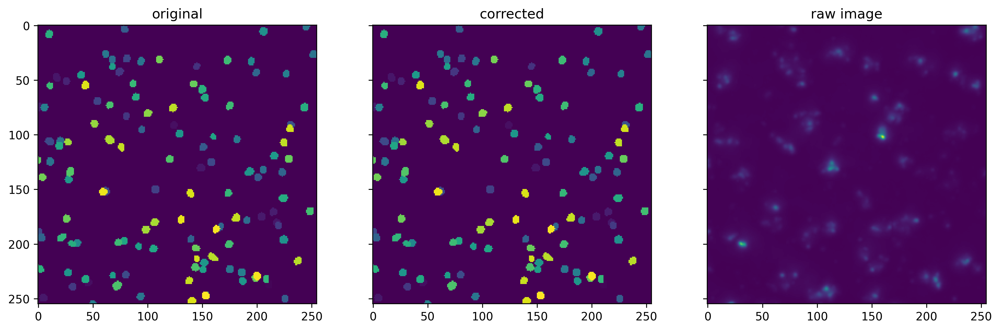

45/64
The number of corrections are 3


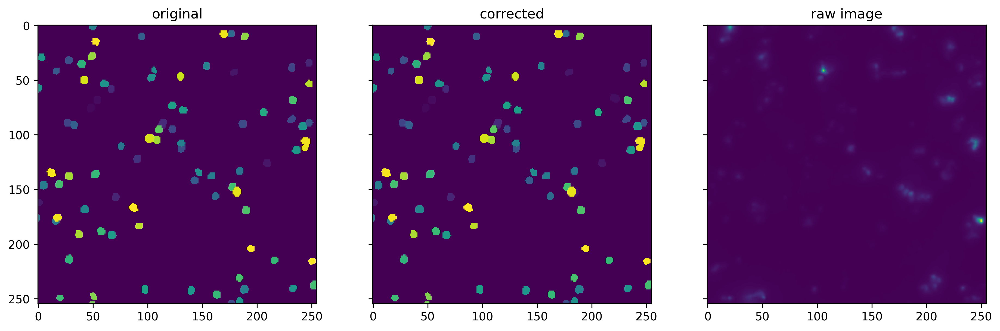

46/64
The number of corrections are 0


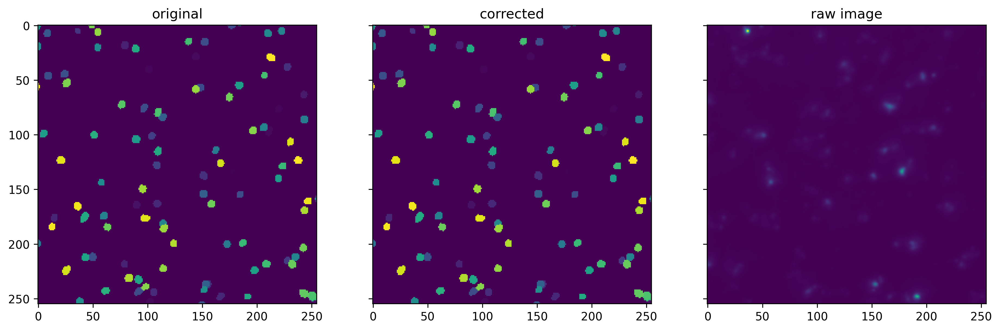

47/64
The number of corrections are 3


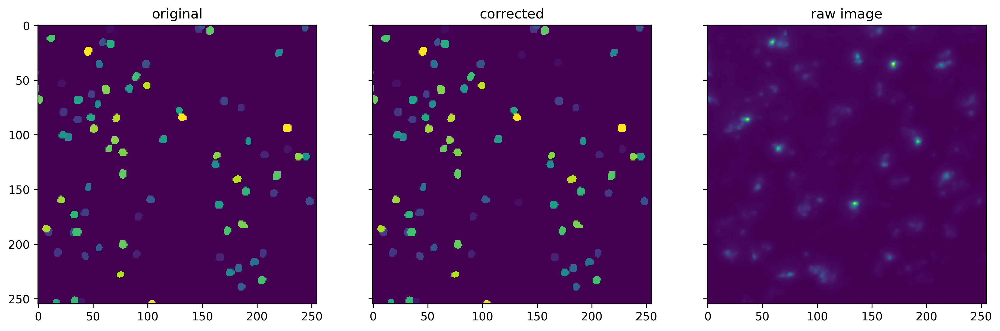

48/64
The number of corrections are 2


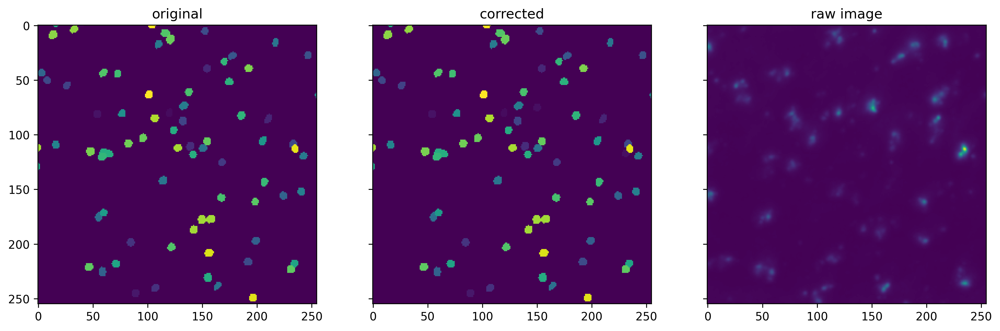

49/64
The number of corrections are 0


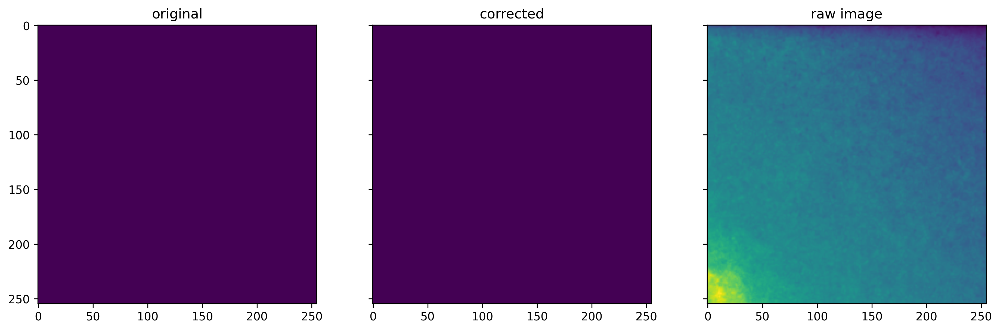

50/64
The number of corrections are 0


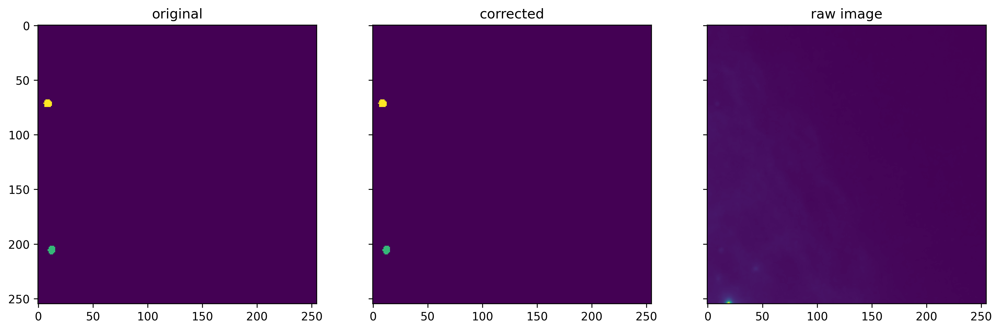

51/64
The number of corrections are 1


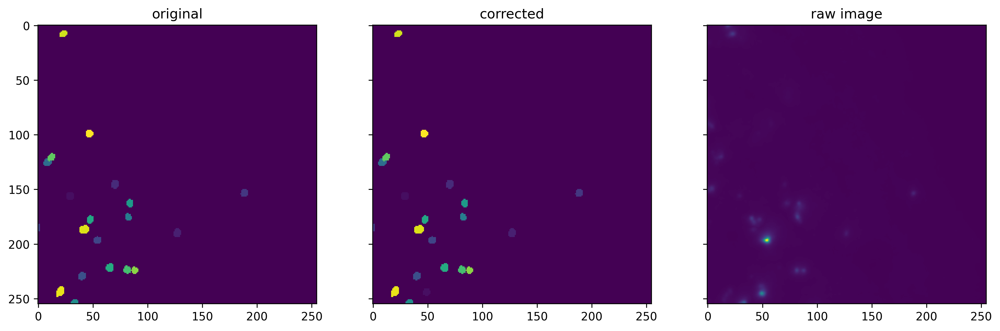

52/64
The number of corrections are 0


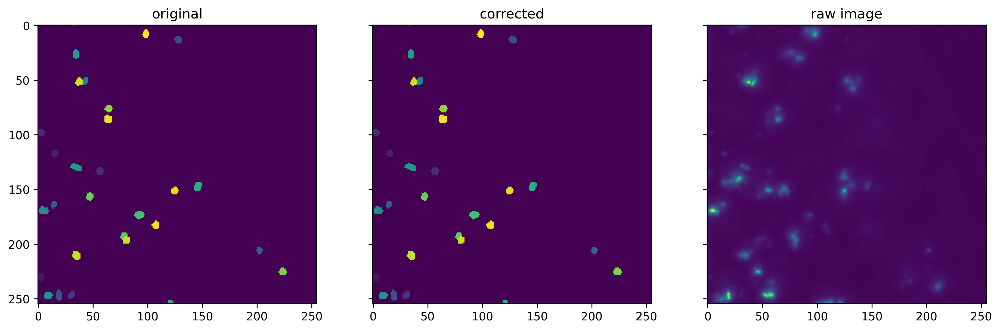

53/64
The number of corrections are 0


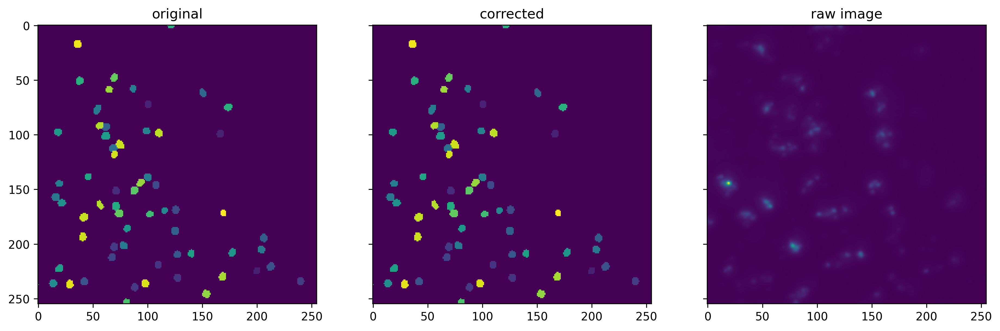

54/64
The number of corrections are 6


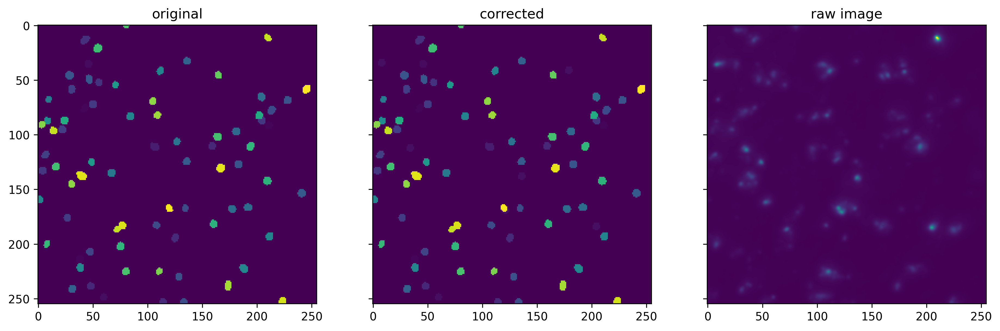

55/64
The number of corrections are 1


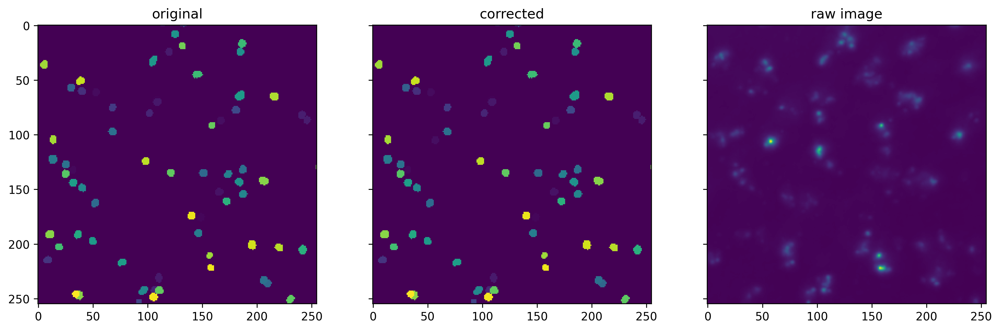

56/64
The number of corrections are 1


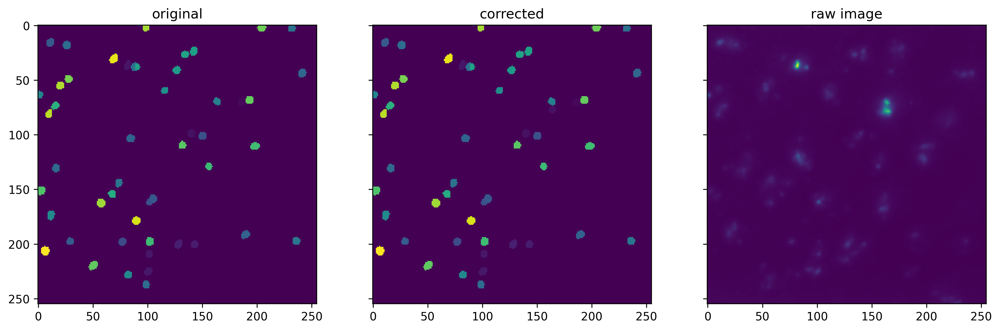

57/64
The number of corrections are 0


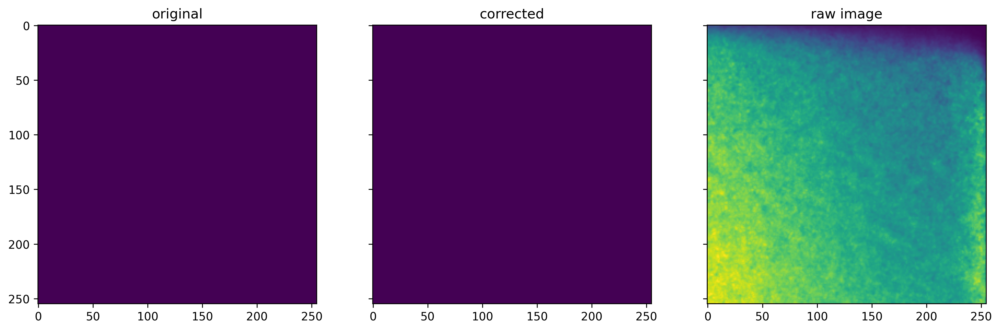

58/64
The number of corrections are 0


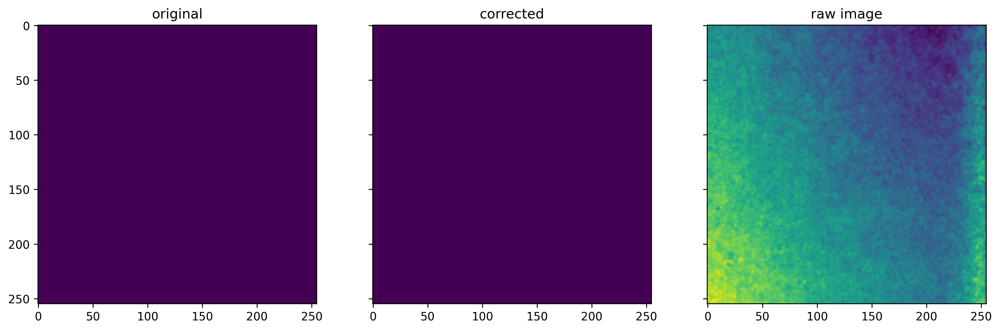

59/64
The number of corrections are 0


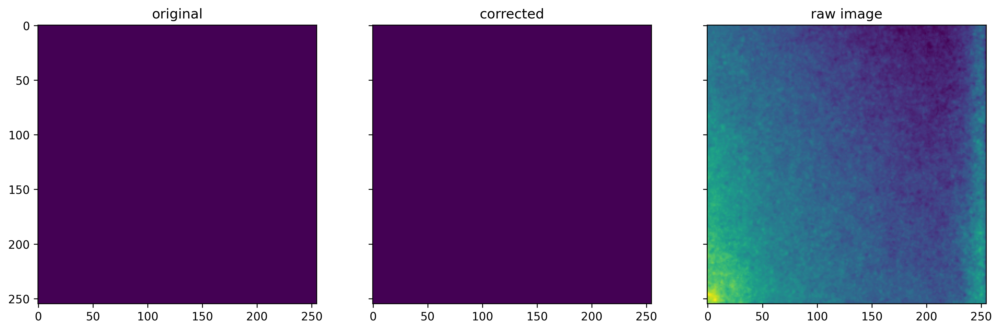

60/64
The number of corrections are 0


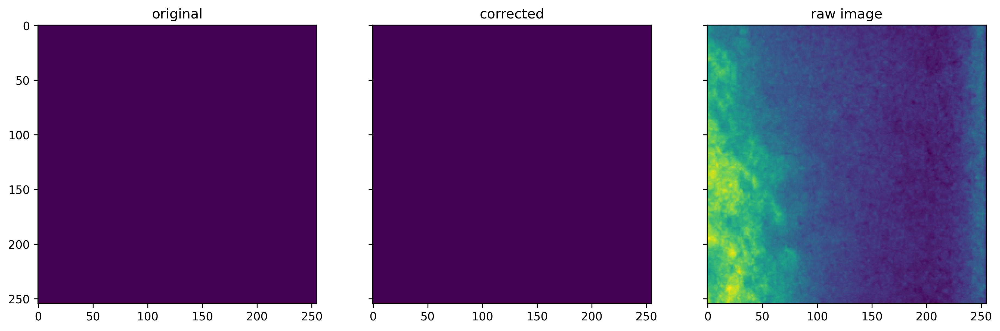

61/64
The number of corrections are 0


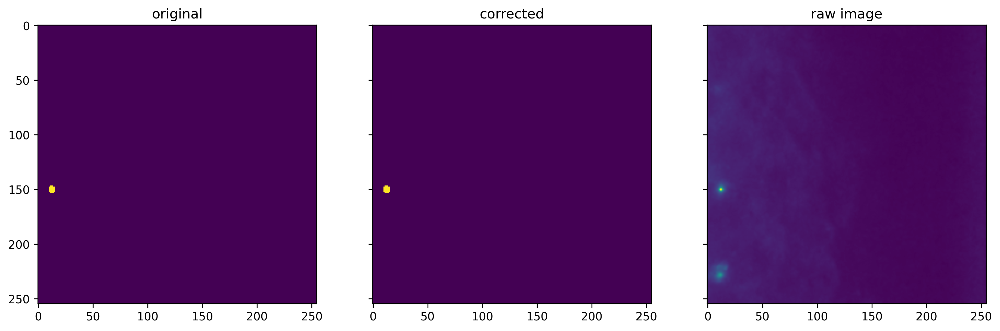

62/64
The number of corrections are 0


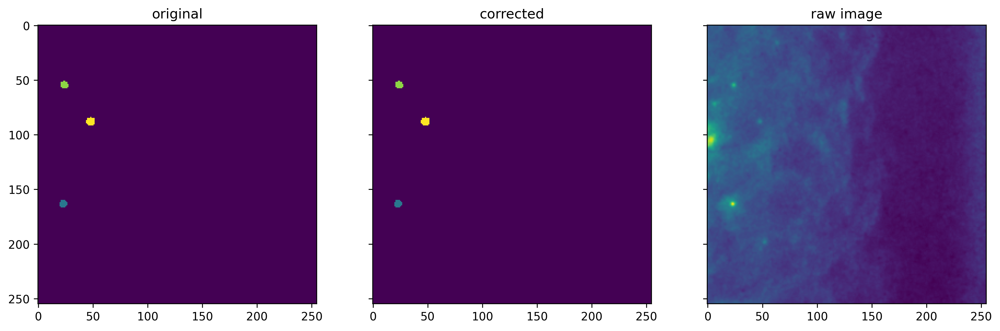

63/64
The number of corrections are 0


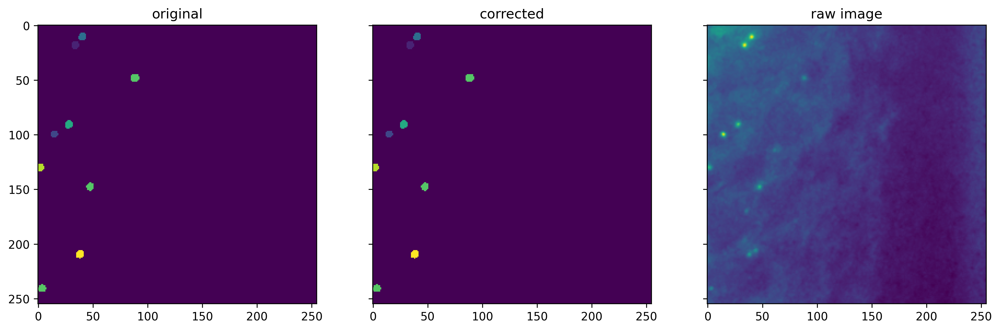

64/64
The number of corrections are 0


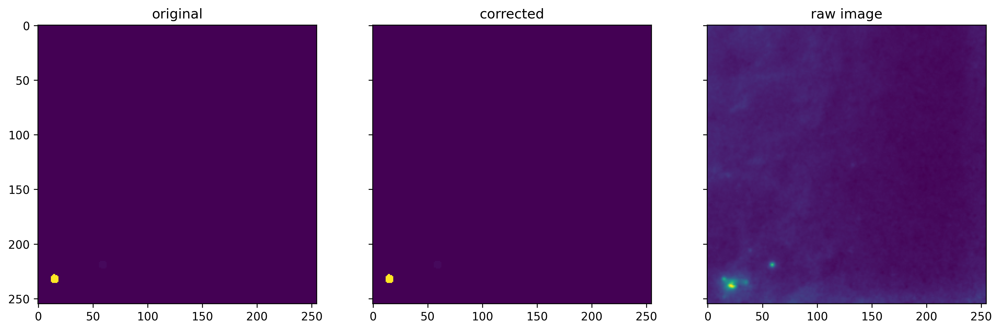

In [54]:
images_3D_r = crop_3D_stack(raw,256,256)
images_3D_l = crop_3D_stack(lab,256,256)

corr_img = []

for i in range(64):
    print(str(i+1)+'/'+'64')
    fig,ax = plt.subplots(1,3, sharex=True, sharey=True,figsize=(15,15))
    corr_img.append(np.max(correction(images_3D_r[i],images_3D_l[i],sphere)[0],axis=0))
    ax[1].imshow(corr_img[i])
    ax[1].set_title('corrected')
    ax[0].imshow(np.max(images_3D_l[i],axis=0))
    ax[0].set_title('original')
    ax[2].imshow(np.max(images_3D_r[i],axis=0))
    ax[2].set_title('raw image')
    
    plt.show()
    

With this image we have at least 20 images were corrections were done.

We noticed that when the images were corrected using splitted images, the algorithm skipped a lot of undetected objects present on the edge. So for beter performances the image will be corrected in full and then splitted. 


In [102]:
raw= np.load('Outputs/raw/data_christophe/training/scan_002_RT34_001_ROI_converted_decon_ch00_raw.npy')

lab = np.load('Outputs/labeled/data_christophe/training/scan_002_RT34_001_ROI_converted_decon_ch00_mask.npy')

In [58]:
# function to call astropy and find matches to quantify the improvement of the correction

def main_full(plot,raw_img,lab_img,sizex,sizey,fwhm,thresh):
    
    position = findstars(plot,raw_img,fwhm,thresh)

    match = exactmatch(lab_img,position)
    
    return match
# the correction can be estimated by calculating the accuracy of the labeled image before and after the correction

FWHM = 3
threshold = 9 

before = (main_full('ye',np.max(raw,axis=0),np.max(lab,axis=0),256,256,FWHM,threshold)/len(findstars('e',np.max(raw,axis=0),FWHM,threshold)))*100
after = (main_full('ye',np.max(raw,axis=0),np.max(correction(raw,lab,sphere),axis=0),256,256,FWHM,threshold)/len(findstars('e',np.max(raw,axis=0),FWHM,9)))*100

print('The accuracy of the network was '+str(round(before,1))+' and is (theoretically) after correction '+str(round(after,1)))

The number of corrections are 82
The accuracy of the network was 73.7 and is (theoretically) after correction 100.0


In [103]:
FWHM = 3
threshold = 9 

len(findstars('e',np.max(raw,axis=0),FWHM,threshold))

289

## Split the large corrected labelled image in small ones

First step is to make sure the small images will have different labels for the training

In [63]:


corr_img = correction_b(raw,lab,sphere)

corr_img = relabel_sequential(corr_img,offset=1)[0]

#cmap= random_label_cmap()
#plt.imshow(np.max(corr_img,axis=0),cmap=cmap)


The number of corrections are 95


Verification that the labels are different

In [97]:
# if the labels are different the distribution of the number of pixel per unique label will be homogeneous

#m = np.unique(corr_img,return_counts=True)[1]

#plt.hist(m[m<1000])

# Creation of a training data set

To create a training data set, the correction algorithm will be performed on several images and the images that were modified will be stored in a folder for the training

### Verify that the images can be corrected

In [102]:
def training(path_1,path_2,):
    
    raw= np.load(path_1)

    lab = np.load(path_2)
    
    FWHM = 3
    threshold = 9 

    before = (main_full('ye',np.max(raw,axis=0),np.max(lab,axis=0),256,256,FWHM,threshold)/len(findstars('e',np.max(raw,axis=0),FWHM,threshold)))*100
    after = (main_full('ye',np.max(raw,axis=0),np.max(correction(raw,lab,sphere_1),axis=0),256,256,FWHM,threshold)/len(findstars('e',np.max(raw,axis=0),FWHM,9)))*100

    print('The accuracy of the network was '+str(round(before,1))+' and is (theoretically) after correction '+str(round(after,1)))
    

data_source_r = "Outputs/raw/data_christophe/training"
data_source_l = "Outputs/labeled/data_christophe/training"

file_list_r = [x for x in glob(data_source_r+os.sep+"*.npy") if "00" in x and "ch00" in x]
file_list_l = [x for x in glob(data_source_l+os.sep+"*.npy") if "00" in x and "ch00" in x]


for i,j in zip(file_list_r,file_list_l):
    training(i,j)

The number of corrections are 82
The accuracy of the network was 73.7 and is (theoretically) after correction 100.0
The number of corrections are 324
The accuracy of the network was 9.8 and is (theoretically) after correction 100.0
The number of corrections are 310
The accuracy of the network was 10.1 and is (theoretically) after correction 100.0


### Perform the correction and save the output 

This is done in multiple steps: 

- The images (full size) are first corrected by calling the function correction and that will yield a labeled image 
- The image is then reshaped by removing one plane over 2 to make the training easier
- The image is then relabeled to ensure that the labels are successive 
- The image is croped in small pieces (here 256 by 256) also the originally labelled image and the raw image are cropped
- We verify croped image per croped image that there was a modification by checking the number of unique number in the original label and the correction. If there is a correction we then store the raw and the corrected croped image
- Finally the image are saved 20% in the testing set and 80% in the training set 


In [138]:
raw= np.load('Outputs/raw/data_christophe/training/scan_002_RT34_001_ROI_converted_decon_ch00_raw.npy')

lab = np.load('Outputs/labeled/data_christophe/training/scan_002_RT34_001_ROI_converted_decon_ch00_mask.npy')


file_list = [x for x in glob('Outputs/raw/data_christophe/training/'+os.sep+"*.npy") if "34" in x and "ch00" in x]
#print(file_list)

# Removing one plane each 2 planes

z_binning = 2


def removesZplanes(image3D, z_binning):
    
    Zrange = range(0,image3D.shape[0],z_binning)
    
    output = np.zeros((len(Zrange),image3D.shape[1],image3D.shape[2]))
    for i,index in enumerate(Zrange):
        output[i,:,:] = image3D[index,:,:]

    return output

# apply the correction 

corr_img = correction(raw,lab,sphere)[0]
corr_img = relabel_sequential(corr_img,offset=1)[0]

# remove one plane over 2 
corr_img = removesZplanes(corr_img,z_binning)
raw = removesZplanes(raw,z_binning)
lab = removesZplanes(lab,z_binning)

print(np.shape(corr_img),np.shape(raw),np.shape(lab))


#split the correction, the raw image and the original labeled image 

split_cor = crop_3D_stack(corr_img,256,256)
split = crop_3D_stack(lab,256,256)
split_raw = crop_3D_stack(raw,256,256)

# list that will contain all the usable images
usable_lab = []
usable_raw = []

#check for each splited image whether something was added compared to the original labeled image if so add it to the list of usable images

for i in range(64):
    if len(np.unique(split[i])) != len(np.unique(split_cor[i])):
        usable_lab.append(split_cor[i])
        usable_raw.append(split_raw[i])

        
#Saving 

for j in range(len(usable_lab)):
    random = np.random.uniform (0,1,1)[0]
    
    if random < 0.21:
        path = 'training_dataset/testing/'
    else:
        path = 'training_dataset/training/'
        
    imwrite(path+'label/'+str(os.path.basename(file_list[0]).rsplit("_raw.npy")[0])+'_'+str(j+1)+'.tif',usable_lab[j].astype(np.uint16))
    imwrite(path+'raw/'+str(os.path.basename(file_list[0]).rsplit(".npy")[0])+'_'+str(j+1)+'.tif',usable_raw[j].astype(np.uint16))

print(str(len(usable_lab))+' files have been loaded')

(40, 2048, 2048) (40, 2048, 2048) (40, 2048, 2048)
30 files have been loaded
